In [1]:
# Import libraries necessary for this project
import numpy as np
import pandas as pd
from time import time
from sklearn.cross_validation import ShuffleSplit
from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import calendar

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace import sarimax as sa
from statsmodels.stats import diagnostic as diag
import functions as fn
from scipy import signal
# Pretty display for notebooks
%matplotlib inline


/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')
/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


### Reading air and hpg data

In [2]:
dateparse = lambda x: pd.datetime.strptime(x, '%Y-%m-%d')
air_visit = pd.read_csv('air_visit_data.csv', parse_dates=['visit_date'],\
                 date_parser=dateparse)

datetimeparse = lambda x: pd.datetime.strptime(x, '%Y-%m-%d %H:%M:%S')
air_reserve = pd.read_csv('air_reserve.csv', parse_dates=\
                          ['visit_datetime', 'reserve_datetime'],\
                          date_parser=datetimeparse)

air_store = pd.read_csv('air_store_info.csv')
air_store['air_area_name'] = air_store['air_area_name'].str.replace('ō','o').str.replace('Ō','O')

hpg_reserve = pd.read_csv('hpg_reserve.csv')
hpg_reserve['visit_datetime'] = pd.to_datetime(hpg_reserve['visit_datetime'])
hpg_reserve['reserve_datetime'] = pd.to_datetime(hpg_reserve['reserve_datetime'])
hpg_store = pd.read_csv('hpg_store_info.csv')
date_info = pd.read_csv('date_info.csv')
holiday_dates = date_info[date_info['holiday_flg'] == 1]['calendar_date']

### Analysing air_visit data
- Visitors per day for store 'air_ba937bf13d40fb24'
- Median, Mean and total number of visitors as a function of the day of week
    * Number of visitors is higher on weekends than on weekdays
- Median and Mean visitors as a function of month

In [60]:
air_visit.head(5)

,air_store_id,visit_date,visitors,day_of_week,month,year
0,air_ba937bf13d40fb24,2016-01-13,25,Wednesday,1,2016
1,air_ba937bf13d40fb24,2016-01-14,32,Thursday,1,2016
2,air_ba937bf13d40fb24,2016-01-15,29,Friday,1,2016
3,air_ba937bf13d40fb24,2016-01-16,22,Saturday,1,2016
4,air_ba937bf13d40fb24,2016-01-18,6,Monday,1,2016


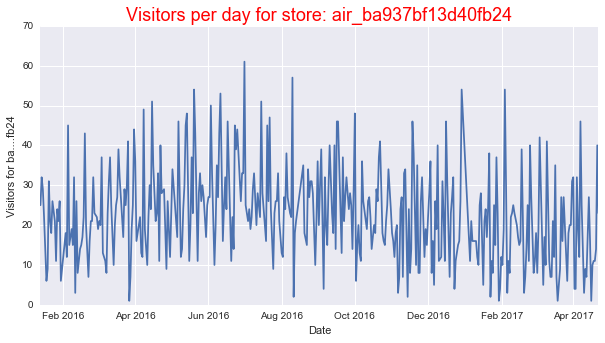

functions.py:30: FutureWarning: specifying 'categories' or 'ordered' in .astype() is deprecated; pass a CategoricalDtype instead
  df['day_of_week'] = df['day_of_week'].astype("category", categories=days, ordered=True)


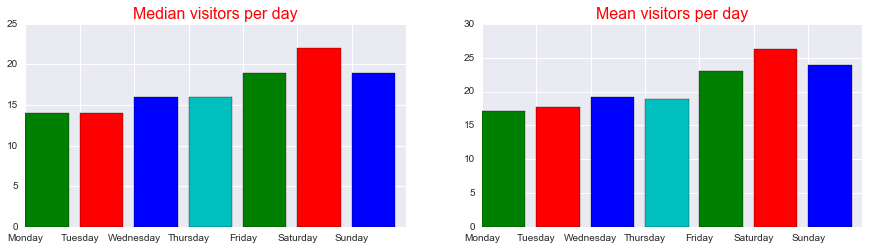

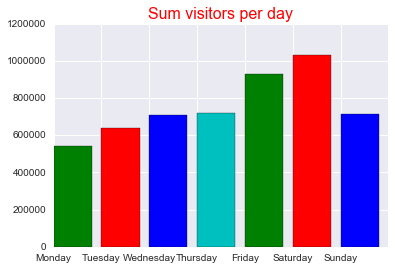

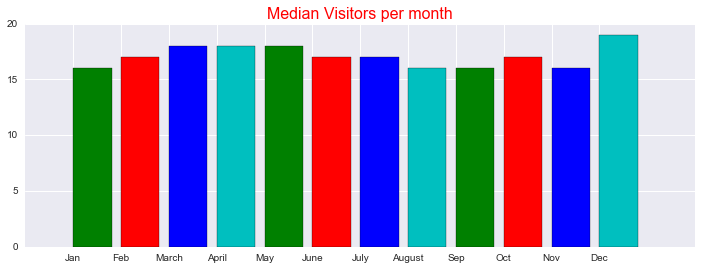

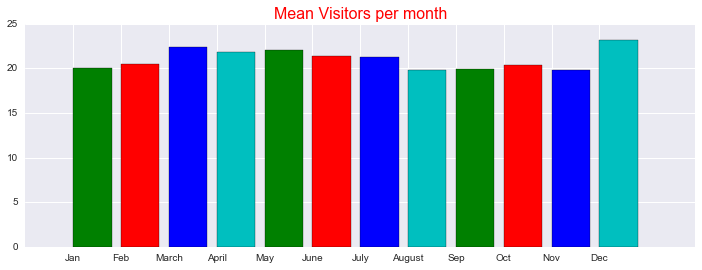

In [3]:
air_visit['air_store_id'].unique()
dfwithIndex = air_visit.set_index('visit_date', drop=False)
dfwithIndex.index.name = None

store = air_visit[air_visit.air_store_id=='air_ba937bf13d40fb24']
plt.figure(figsize=(10,5))
plt.plot(store.visit_date, store.visitors)
plt.ylabel('Visitors for ba....fb24')
plt.xlabel('Date')
plt.title('Visitors per day for store: air_ba937bf13d40fb24', fontsize=18, color = 'red')
plt.show()

fn.stats_day(air_visit)
fn.stats_month(air_visit)

Graphs below show that there is a yearly periodicity (weak) in the data

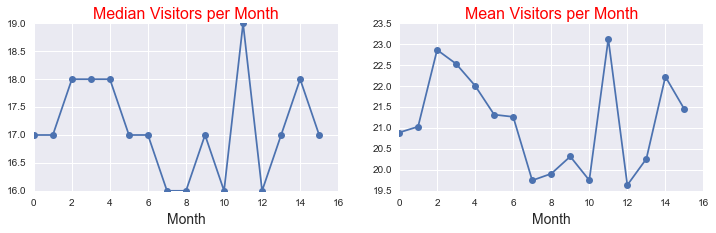

In [4]:
from datetime import datetime
air_visit['year'] = air_visit['visit_date'].dt.year
mdvstors_month = air_visit.groupby(['month', 'year'], as_index=False)['visitors'].median()
meanvstors_month = air_visit.groupby(['month', 'year'], as_index=False)['visitors'].mean()
mdvstors_month.sort_values('year', inplace=True)
mdvstors_month.reset_index(drop=True, inplace=True)
meanvstors_month.sort_values('year', inplace=True)
meanvstors_month.reset_index(drop=True, inplace=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 3))
ax1.plot(mdvstors_month.index, mdvstors_month['visitors'], 'o-')
ax1.set_title('Median Visitors per Month', fontsize = 16, color = 'red')
ax1.set_xlabel('Month', fontsize = 14)
ax2.plot(meanvstors_month.index, meanvstors_month['visitors'], 'o-')
ax2.set_title('Mean Visitors per Month', fontsize = 16, color = 'red')
ax2.set_xlabel('Month', fontsize = 14)

#### Distribution of visitors in one group
- Distribution of total visitors, peak is around 10 visitors
- Distribution of visitors in store air_ba937bf13d40fb24, peak is around 20 visitors

(0, 100)

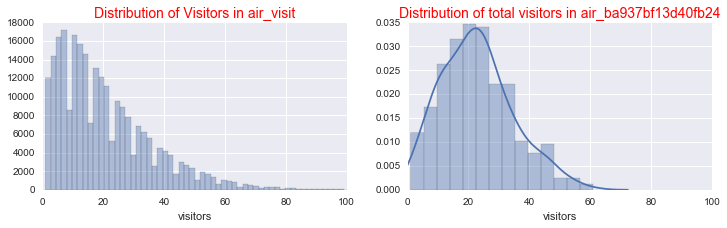

In [5]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 3))
sns.distplot(air_visit['visitors'], bins= 500, kde=False, ax = ax1)
ax1.set_title('Distribution of Visitors in air_visit', fontsize = 14, color='red')
ax1.set_xlim(0, 100)
sns.distplot(air_visit[air_visit.air_store_id=='air_ba937bf13d40fb24']['visitors'], ax = ax2)
ax2.set_title('Distribution of total visitors in air_ba937bf13d40fb24', fontsize = 14, \
              color='red')
ax2.set_xlim(0, 100)

Total visitors (in air_visit) as a function of date. There is a jump in total number of visitors around July 1st. The second plot show that there is a weekly periodicity in the data.

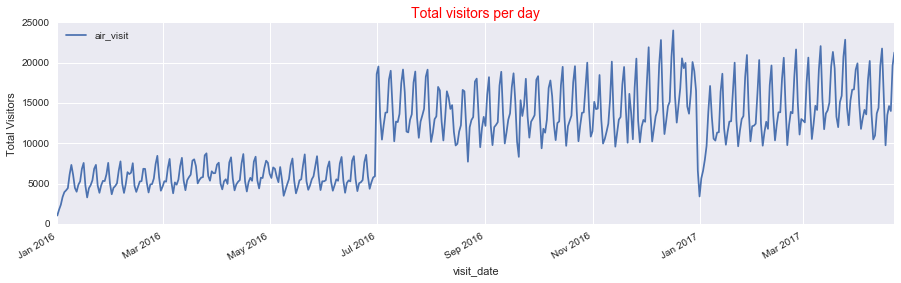

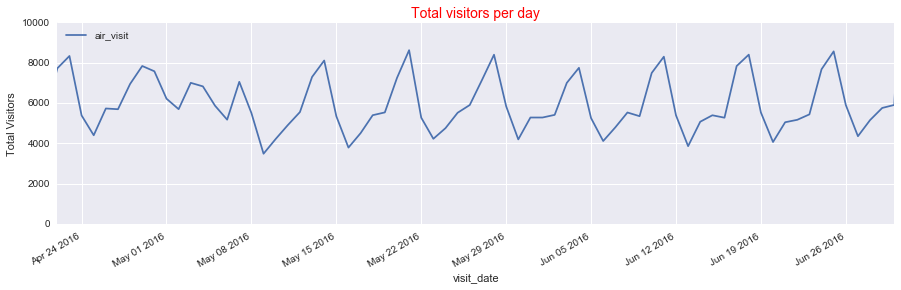

In [6]:
reload(fn)
Totalvisitors_day = air_visit.groupby('visit_date', as_index=False)\
                    ['visitors'].sum()

with fn.totvstors_date(Totalvisitors_day, None, None) as img1:
    fn.savefig(img1, 'img/my_image_a.png')
    img1.close()

with fn.totvstors_date(Totalvisitors_day, ('2016-04-22', '2016-06-30'), (0, 10000)) as img2:
    fn.savefig(img2, 'img/my_image_b.png')
    img2.close()
    
plt.show()


##### Distribution of total visitors before (left plot) and after (right plot) July 1
- Total number of visitors peaks at 5000 visitors before July 1st
- Total number of visitors peaks at 15000 visitors after July 1st

It could be that new stores were added in the data collection process on July 1st.

/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  from ipykernel import kernelapp as app
/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:7: FutureWarning: 'visit_date' is both a column name and an index level.
Defaulting to column but this will raise an ambiguity error in a future version
/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:9: FutureWarning: 'visit_date' is both a column name and an index level.
Defaulting to column but this will raise an ambiguity error in a future version
/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:15: FutureWarning: 'visit_date' is both a column name and an

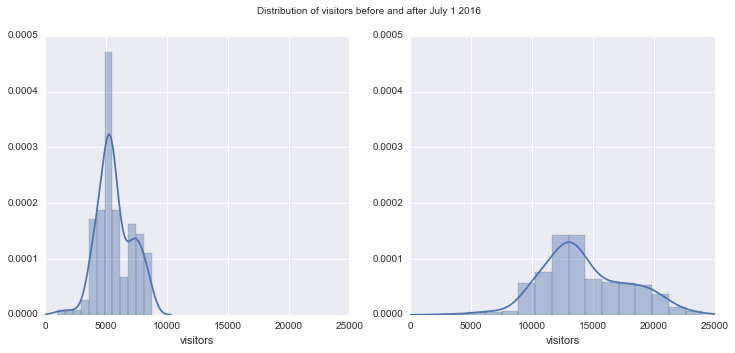

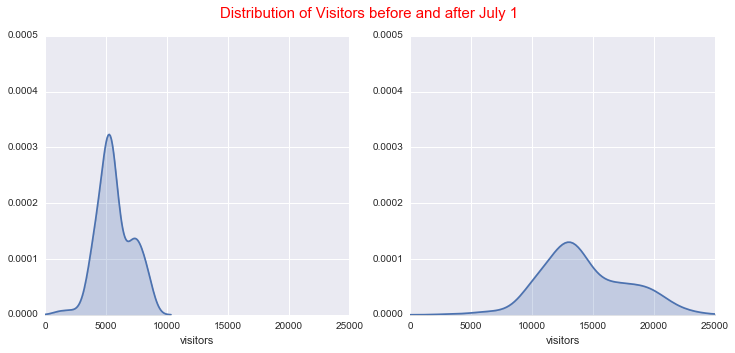

In [7]:
air_visit.set_index('visit_date', drop=False, inplace=True)
air_visit_Jan1_Jun30 = air_visit.ix['2016-01-01':'2016-06-30']
air_visit_July1on = air_visit.ix['2016-06-30':]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 5))
fig.suptitle('Distribution of visitors before and after July 1 2016')
sns.distplot(air_visit_Jan1_Jun30.groupby('visit_date')['visitors'].sum(), ax=ax1)
ax1.set(xlim=(0, 25000))
sns.distplot(air_visit_July1on.groupby('visit_date')['visitors'].sum(), ax=ax2)
ax2.set(ylim=(0, .0005))
ax2.set(xlim=(0, 25000))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 5))

sns.distplot(air_visit_Jan1_Jun30.groupby('visit_date')['visitors'].sum(), ax=ax1, hist=False, \
             kde_kws={"shade": True})
ax1.set(xlim=(0, 25000))
ax1.set(ylim=(0, .0005))

sns.distplot(air_visit_July1on.groupby('visit_date')['visitors'].sum(), ax=ax2,hist=False, \
             kde_kws={"shade": True})
ax2.set(ylim=(0, .0005))
ax2.set(xlim=(0, 25000))
fig.suptitle('Distribution of Visitors before and after July 1', fontsize = 15, color = 'red')

fig.savefig('img/TV_dist_before_after_July1.png')

Counting the number of stores before and after July 1st. We can see that almost 500 more stores were added in the database. Therefore 

In [8]:
original_stores = air_visit_Jan1_Jun30.air_store_id.unique()
additional_stores = set(air_visit_July1on.air_store_id.unique()).difference \
                   (set(air_visit_Jan1_Jun30.air_store_id.unique()))
Total_stores = air_visit_July1on.air_store_id.unique()

genres = air_store['air_genre_name'].unique()
areas  = air_store['air_area_name'].unique()

start_date, end_date = min(air_visit['visit_date'].dt.date), max(air_visit['visit_date'].dt.date)

print 'Number of original stores (before July 1st): {}'.format(len(original_stores))
print 'Number of additional stores (after July 1st): {}'.format(len(additional_stores))
print 'Total Number of stores in air_visit dataset: {}'.format(len(Total_stores))
print 'Total Number of genres in air_store dataset: {}'.format(len(genres))
print 'Total Number of stores in air_visit dataset: {}'.format(len(areas))
print 'Starting and end date of air_visit data: {}, {}'.format(start_date, end_date)

Number of original stores (before July 1st): 316
Number of additional stores (after July 1st): 513
Total Number of stores in air_visit dataset: 829
Total Number of genres in air_store dataset: 14
Total Number of stores in air_visit dataset: 103
Starting and end date of air_visit data: 2016-01-01, 2017-04-22


Total number of visitors for:
- Original stores
- Additional stores

Total visitors per restaurant for original and additional stores. This shows that the number of visitors per restaurant per day is similar for original and additional stores.

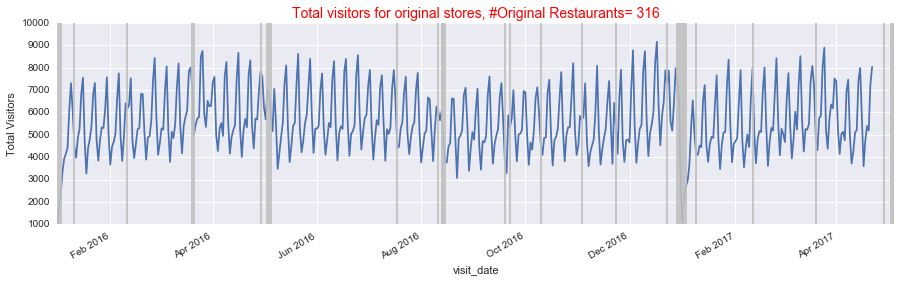

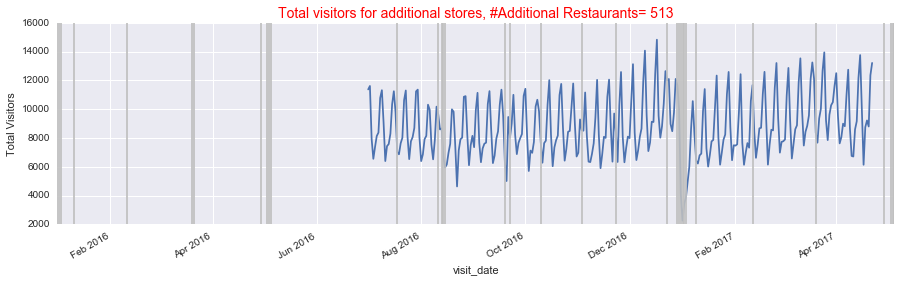

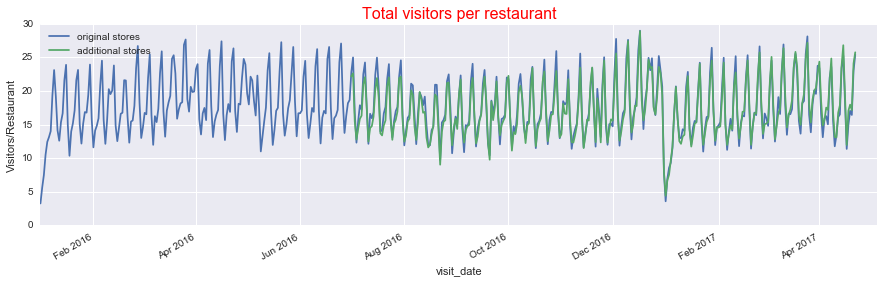

In [9]:
air_visit.reset_index(drop=True, inplace=True)
air_visit_orgnal_stores = air_visit[air_visit['air_store_id'].isin(original_stores)]
air_visit_add_stores = air_visit[air_visit['air_store_id'].isin(additional_stores)]

Totalvisitors_orgnal_stores = air_visit_orgnal_stores.groupby('visit_date', as_index = False)['visitors'].sum()
Totalvisitors_add_stores = air_visit_add_stores.groupby('visit_date', as_index = False)['visitors'].sum()
Totalvisitors_add_stores.to_pickle('Totalvisitors_add_stores.pickle')

fn.totvstors_date_hol(Totalvisitors_orgnal_stores, holiday_dates, \
'Total visitors for original stores, #Original Restaurants= {}'.format(len(original_stores)))
    
fn.totvstors_date_hol(Totalvisitors_add_stores, holiday_dates,  \
'Total visitors for additional stores, #Additional Restaurants= {}'.format(len(additional_stores)))

fig, ax = plt.subplots(figsize=(15, 4))
ax.plot(Totalvisitors_orgnal_stores.visit_date, Totalvisitors_orgnal_stores.visitors/float(len(original_stores)), \
        label = 'original stores')
ax.plot(Totalvisitors_add_stores.visit_date, Totalvisitors_add_stores.visitors/float(len(additional_stores)), \
        label = 'additional stores')
plt.title('Total visitors per restaurant', fontsize = 16, color='red')   
legend = ax.legend(loc = 'upper left', shadow = True)
plt.xlabel('visit_date')
plt.xlim('2016-01-01', '2017-05-05')
plt.ylabel('Visitors/Restaurant')
# plt.gca().xaxis.set_major_locator(months)
plt.gcf().autofmt_xdate(rotation=30)
fig.savefig('img/TV_dist_before_after_July1.png')
plt.show()

Autocorrelation and partial autocorrelation in these time series:
- Total visitors per day
- Total visitors per day in original stores
- Total visitors per day in additional stores
- Total visitors per day per restaurant for original stores

Notice the weekly periodicity in all of these ACF plots.

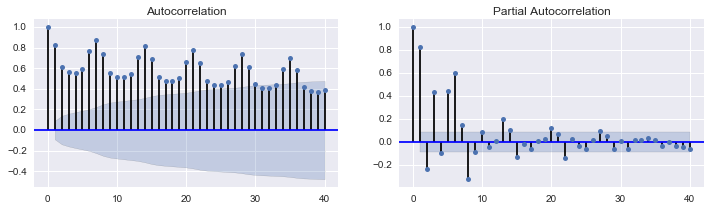

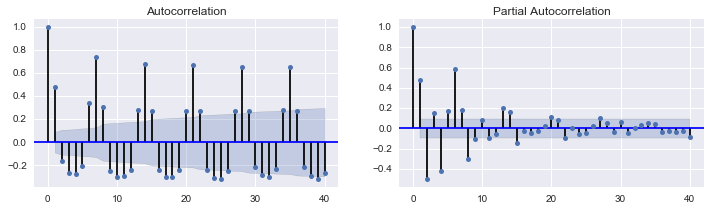

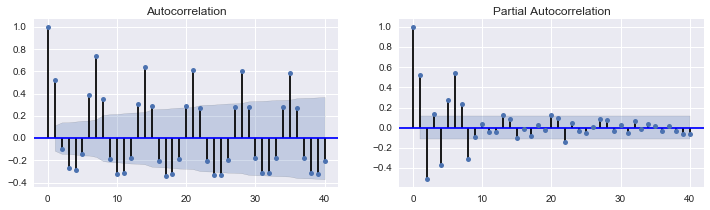

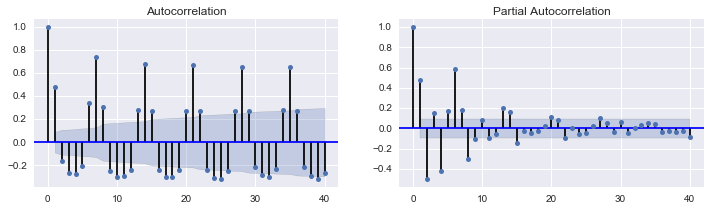

In [10]:
fn.ACF(Totalvisitors_day.visitors)
fn.ACF(Totalvisitors_orgnal_stores.visitors)
fn.ACF(Totalvisitors_add_stores.visitors)
fn.ACF(Totalvisitors_orgnal_stores.visitors/float(len(original_stores)))

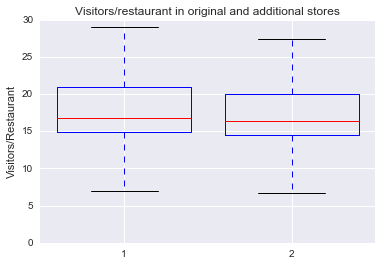

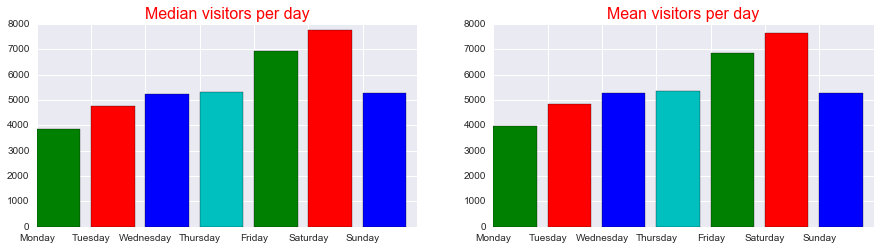

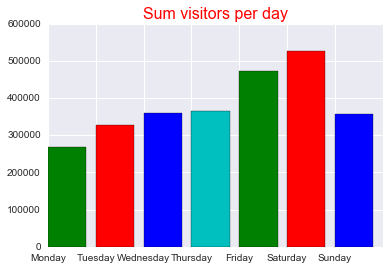

In [11]:
s1 = Totalvisitors_orgnal_stores.visitors/float(len(original_stores))
s2 = Totalvisitors_add_stores.visitors/float(len(additional_stores))

plt.boxplot ([s1.values, s2.values],widths=.8)
plt.ylabel('Visitors/Restaurant')
plt.title('Visitors/restaurant in original and additional stores')
xlabels = ["Original stores", "Additional stores"]
plt.show()

fn.stats_day(Totalvisitors_orgnal_stores)

#### Checking Stationarity & Augmented Dickey-Fuller test
The ADF test shows that the series 'Totalvisitors_orgnal_stores' is stationary. 

In [12]:
fn.ADF(Totalvisitors_orgnal_stores['visitors'])

mean1=5668.677824, mean2=5533.581590
variance1=1886540.000809, variance2=2025653.185542
ADF Statistic: -4.121228
p-value: 0.000893
Critical Values:
	5%: -2.868
	1%: -3.445
	10%: -2.570


The box plots below show the visitors per day per restaurant in original and additional stores. Median number of visitors in the two cases is very similar.

Then I plot the mean, median and total number of visitors per day for different days of the week.

#### Removing seasonality from the data through differencing
Since our data has weekly periodicity, we need to remove this periodicity in order to find out the non-seasonal and seasonal orders for time series analysis. I take the difference 
xt-B(7)xt, where B(7) is the backward opertor for the previous week. 

With this operation, we can see that we have removed all the patterns from ACF and PACF plots and we can determine the nonseasonal (p, d, q) and seasonal (P, D, Q). We will do it in the notebook named 'Time Series Model'.
The results below (p-value = 0 and ADF statistic < all the critical values) show that (1-B7)Xt does not have a unit root.
Notice that ACF does not have any periodic structure after differencing. There is tappering in ACF for lower lags. 

Before taking xt-B(7)xt, I also tried xt-B(1)xt and xt-B(2)xt to see if they remove the seasonality from the data. As we can see, there still is periodic structure remaining after taking the 1st and 2nd differencing.

mean1=71.510638, mean2=9.029661
variance1=777855.934715, variance2=1017442.445925
ADF Statistic: -6.463470
p-value: 0.000000
Critical Values:
	5%: -2.868
	1%: -3.445
	10%: -2.570


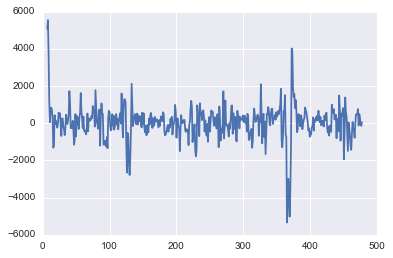

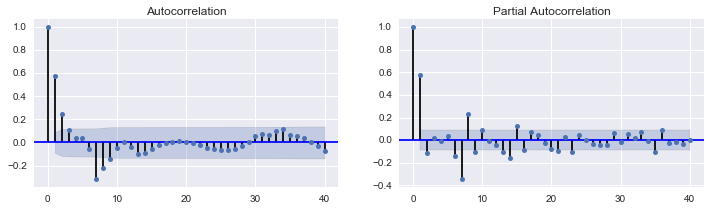

In [13]:
TV_orgnal_stores_diff7 = (Totalvisitors_orgnal_stores.visitors-Totalvisitors_orgnal_stores.visitors.shift(7)).dropna()
plt.plot(TV_orgnal_stores_diff7)

fn.ACF(TV_orgnal_stores_diff7)
fn.ADF(TV_orgnal_stores_diff7)

mean1=24.142857, mean2=5.246862
variance1=1848098.798071, variance2=2154778.396786
ADF Statistic: -7.582818
p-value: 0.000000
Critical Values:
	5%: -2.868
	1%: -3.445
	10%: -2.570


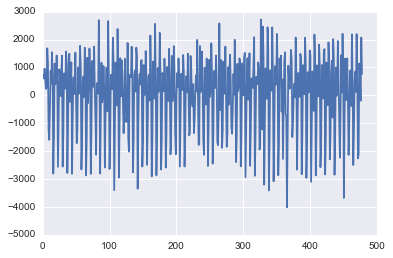

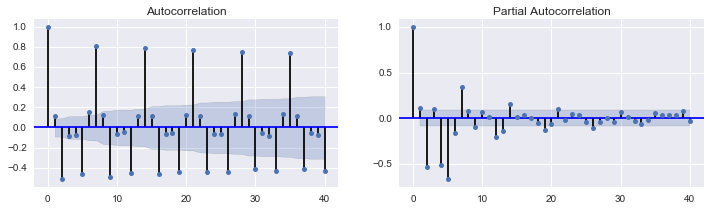

In [14]:
TV_orgnal_stores_diff1 = (Totalvisitors_orgnal_stores.visitors-Totalvisitors_orgnal_stores.visitors.shift(1)).dropna()
plt.plot(TV_orgnal_stores_diff1)

fn.ACF(TV_orgnal_stores_diff1)
fn.ADF(TV_orgnal_stores_diff1)

mean1=46.571429, mean2=5.953782
variance1=4188586.026522, variance2=4759558.246800
ADF Statistic: -7.951492
p-value: 0.000000
Critical Values:
	5%: -2.868
	1%: -3.445
	10%: -2.570


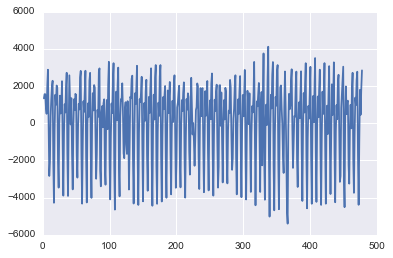

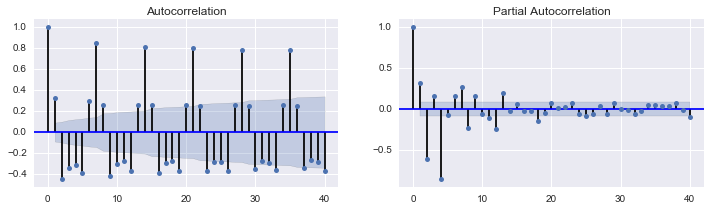

In [15]:
TV_orgnal_stores_diff2 = (Totalvisitors_orgnal_stores.visitors-Totalvisitors_orgnal_stores.visitors.shift(2)).dropna()
plt.plot(TV_orgnal_stores_diff2)

fn.ACF(TV_orgnal_stores_diff2)
fn.ADF(TV_orgnal_stores_diff2)

#### Decomposing time series
Decomposing a time series into seasonal and trend components. In our time series, although we don't have trend it seems that there is yearly periodicity, and that shows up in the trend in the figure below.

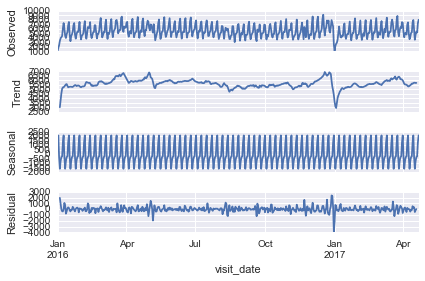

In [16]:
from statsmodels.tsa.seasonal import seasonal_decompose
Totalvisitors_orgnal_stores.set_index('visit_date', inplace=True)
decomposition = seasonal_decompose(Totalvisitors_orgnal_stores.visitors,  model='additive')
decomposition.plot()
plt.show()

#### FFT 
To find a clear signal for yearly periodicity, I also tried to use fft but that did not work. In any case, I am including this part in the report to show that I tried various things to get different periodicities.

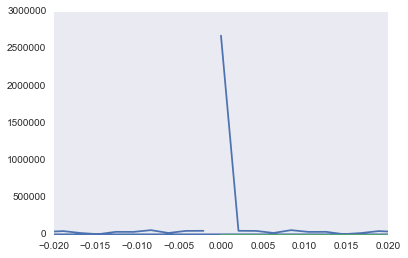

In [17]:
from numpy import fft
x = Totalvisitors_orgnal_stores.visitors
spectrum = fft.fft(Totalvisitors_orgnal_stores.visitors)
freq = fft.fftfreq(len(spectrum))
plt.plot(freq, abs(spectrum))
plt.xlim(-.02, .02)

N = x.size
X_db = 20*np.log10(2*np.abs(spectrum)/N)
Fs =  10
f = np.arange(0, N)*Fs/N
plt.plot(f, X_db)
plt.grid()
plt.show()

threshold = 0.5 * max(abs(spectrum))
mask = abs(spectrum) > threshold
peaks = freq[mask]

Look at the correlation between visitors at time t and visitors at time t-7. We can see that there is a high correlation of 0.77.

In [18]:
Totalvisitors_orgnal_stores['t7'] = Totalvisitors_orgnal_stores.visitors.shift(7)
Totalvisitors_orgnal_stores.dropna()
Totalvisitors_orgnal_stores.dropna().corr(method='pearson')

,visitors,t7
visitors,1.000000,0.765335
t7,0.765335,1.000000


Plotting moving average as a function of time see a clear indication of yearly periodicity. 

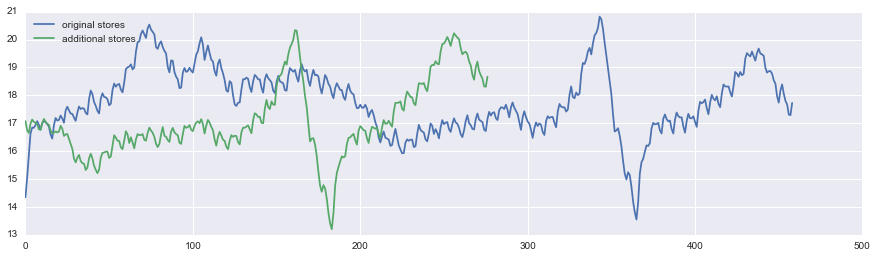

In [19]:
window = 20
mavg_vstors_orgnal_stors = fn.mavg(window, Totalvisitors_orgnal_stores.visitors/float(len(original_stores)))
mavg_vstors_add_stors = fn.mavg(window, Totalvisitors_add_stores.visitors/float(len(additional_stores)))

fig, ax = plt.subplots(figsize=(15, 4))
ax.plot(mavg_vstors_orgnal_stors, label = 'original stores')
ax.plot(mavg_vstors_add_stors, label = 'additional stores')
legend = ax.legend(loc = 'upper left', shadow = True)

plt.show()

### Analysing air_reserve Data

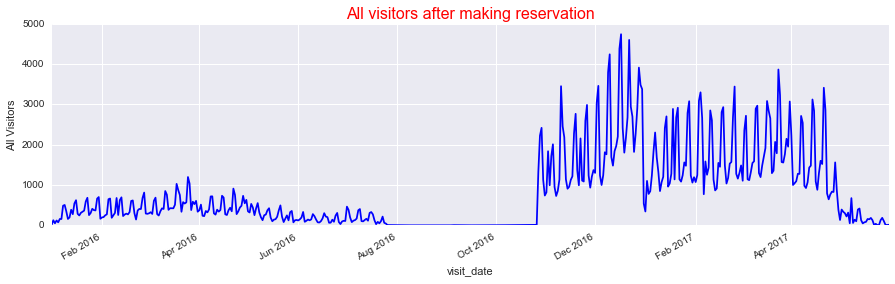

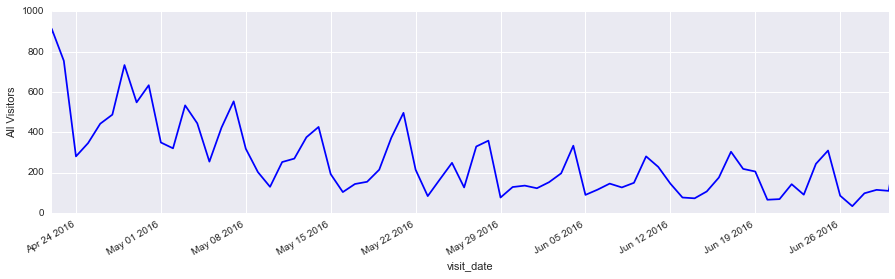

In [20]:
Total_resvisitors_day = air_reserve.groupby\
([air_reserve['visit_datetime'].dt.date])['reserve_visitors'].sum()

fig = plt.figure(figsize=(15, 4))
plt.plot(Total_resvisitors_day.index, Total_resvisitors_day, color='blue')
plt.xlabel('visit_date')
plt.ylabel('All Visitors')
plt.title('All visitors after making reservation', fontsize = 16, color = 'red')
# plt.gca().xaxis.set_major_locator(months)
plt.gcf().autofmt_xdate(rotation=30)
plt.show()

fig = plt.figure(figsize=(15, 4))
plt.plot(Total_resvisitors_day.index, Total_resvisitors_day, color = 'blue')
plt.xlabel('visit_date')
plt.ylabel('All Visitors')
plt.xlim('2016-04-22', '2016-06-30')
plt.ylim(0, 1000)
plt.gcf().autofmt_xdate(rotation=30)


In [21]:
air_reserve['reservation_inadvance'] = \
air_reserve['visit_datetime'].subtract(air_reserve['reserve_datetime'])

air_reserve['reservation_time'] = \
(air_reserve['reservation_inadvance'].dt.components.days)*24+ \
(air_reserve['reservation_inadvance'].dt.components.hours)

Total_resvisitors_hour = air_reserve.groupby\
([air_reserve['visit_datetime'].dt.time])['reserve_visitors'].sum()

reservationTOvisit_time = air_reserve.groupby('reservation_time', \
                         as_index=False)['reserve_visitors'].sum()

Following plot (left) shows that the reservations are mostly made for dinner and that the peak hour for visiting a restaurant is around 6pm. The right plot shows that mostly people make reservation just before visiting a restaurant. The next peak shows that people making a reservation 24 hour prior to visit (ie, previous evening). Then we have the periodicity of 24 hours in the plot.

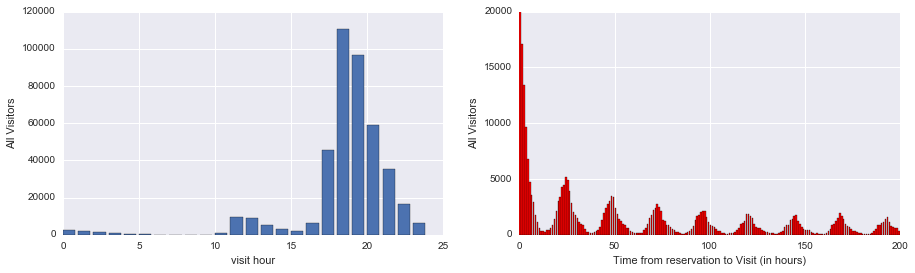

In [22]:
Total_resvisitors_hour = Total_resvisitors_hour.reset_index(drop=True)
fig = plt.figure(figsize=(15, 4))
fig.add_subplot(1, 2, 1)
plt.bar(Total_resvisitors_hour.index, Total_resvisitors_hour)
plt.xlabel('visit hour')
plt.ylabel('All Visitors')
plt.autoscale()

fig.add_subplot(1, 2, 2)
plt.bar(reservationTOvisit_time.reservation_time, \
        reservationTOvisit_time.reserve_visitors, color = 'red')
plt.xlabel('Time from reservation to Visit (in hours)')
plt.ylabel('All Visitors')
plt.xlim(0,200)
plt.ylim(0,20000)
plt.show()

#### Reservation vs Visit

In the following plot, I show the number of visitors for a given store and given day from the air_reserve data and air_visit data.

['air_store_id', 'visit_date', 'visitors', 'day_of_week', 'month', 'year']
['air_store_id', 'visit_datetime', 'reserve_datetime', 'reserve_visitors', 'reservation_inadvance', 'reservation_time']


/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


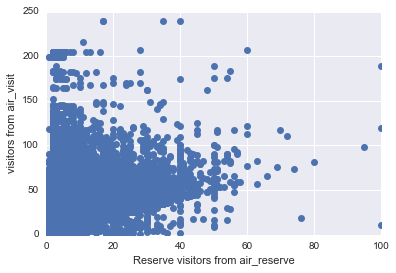

In [23]:
print list(air_visit)
print list(air_reserve)
df1 = air_visit.iloc[:,[0,1,2]]
df2 = air_reserve.iloc[:,[0,3]]

df2['visit_date'] = pd.DatetimeIndex(air_reserve.visit_datetime).normalize()
df3 = df1.merge(df2, on = ['air_store_id', 'visit_date'])

plt.plot(df3.reserve_visitors, df3.visitors, 'o')
plt.ylabel('visitors from air_visit')
plt.xlabel('Reserve visitors from air_reserve')

### air_store_info data

In the following we plot the number of restaurants for different genre (cuisine type). Next plot is for number of restaurants in a given area. Here, instead of area name on the x-axis, I have simply plotted the index of the restaurant. 

In [24]:
latitude_longitude = air_store.groupby(['latitude', 'longitude'], \
                                      as_index=False)['air_store_id'].count()
print type(latitude_longitude)
latitude_longitude
cuisine_type = air_store.groupby('air_genre_name', as_index=False) \
                                ['air_store_id'].count()
# cuisine_type.sort('air_store_id', ascending=False)
cuisine_type.sort_values(by='air_store_id', ascending=False, inplace=True)

area_name = air_store.groupby('air_area_name', as_index=False) \
                                ['air_store_id'].count()
area_name.sort_values(by='air_store_id', ascending=False, inplace=True)

<class 'pandas.core.frame.DataFrame'>


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102]


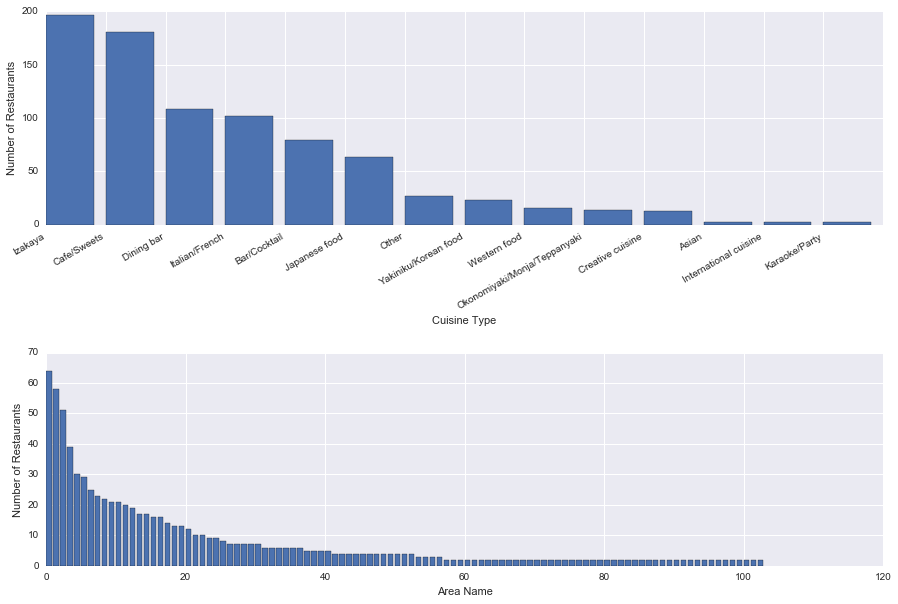

In [25]:
fig = plt.figure(figsize=(15, 11))
fig.add_subplot(2, 1, 1)

cuisines = [i for i in range(0, len(cuisine_type))]
plt.bar(cuisines, cuisine_type.air_store_id)
plt.xlabel('Cuisine Type')
plt.ylabel('Number of Restaurants')
plt.xticks(cuisines, cuisine_type.air_genre_name)
plt.gcf().autofmt_xdate(rotation=30)

fig.add_subplot(2, 1, 2)
area_ids = [i for i in range(0, len(area_name))]
print area_ids
plt.bar(area_ids, area_name.air_store_id)
plt.xlabel('Area Name')
plt.ylabel('Number of Restaurants')
plt.subplots_adjust(hspace=0.6)

Distribution of restaurant genre in a given area. The larger the circle diameter, the greater the number of restaurants in that area for a given genre.

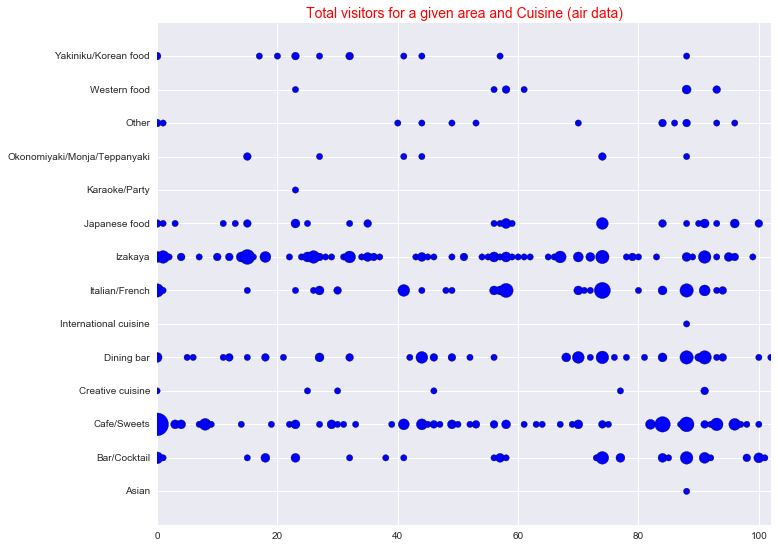

In [26]:
df = air_store.groupby(['air_area_name', 'air_genre_name'], as_index=False)['air_store_id'].count()

x = df.iloc[:,0]
uniques_x, X = np.unique(x, return_inverse=True)

y = df.iloc[:,1]
uniques_y, Y = np.unique(y, return_inverse=True)

plt.rc('font', **{'sans-serif' : 'Arial',
                           'family' : 'sans-serif'})

fig = plt.figure(figsize=(11, 9))
s = df.iloc[:,2].values*20

plt.scatter(X,Y,s=s)
plt.xlim(0, 102)
plt.yticks(np.arange(min(Y), max(Y)+1, 1.0), uniques_y)
plt.ylim(-1, 14)
plt.title('Total visitors for a given area and Cuisine (air data)', fontsize = 14, color='red')
plt.show()
lst = df[df['air_genre_name'] == 'Italian/French'].iloc[:,2]



### hpg reserve data

hpg_reserve data also shows similar trends as the air_reserve data, the only difference is that its database is bigger than that of air_reserve. 

As shown in the following plots, hpg_reserve also shows that reservations are mostly done for dinner and that the visit time peaks around 6pm. The plot on the right shows that the reservations are done just before the dinner time or 24 hours prior.

In [27]:
hpg_reserve['reservation_inadvance'] = \
hpg_reserve['visit_datetime'].subtract(hpg_reserve['reserve_datetime'])

hpg_reserve['reservation_time'] = \
(hpg_reserve['reservation_inadvance'].dt.components.days)*24+ \
(hpg_reserve['reservation_inadvance'].dt.components.hours)

Total_hpgres_visitors_hour = hpg_reserve.groupby\
([hpg_reserve['visit_datetime'].dt.time])['reserve_visitors'].sum()

hpg_reservationTOvisit_time = hpg_reserve.groupby('reservation_time', \
                         as_index=False)['reserve_visitors'].sum()

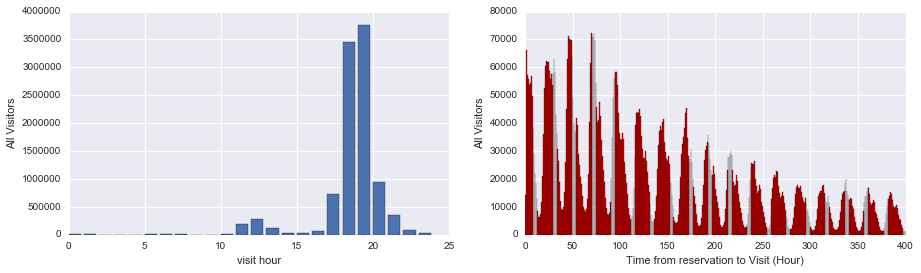

In [28]:
Total_hpgres_visitors_hour = Total_hpgres_visitors_hour.reset_index(drop=True)
fig = plt.figure(figsize=(15, 4))
fig.add_subplot(1, 2, 1)
plt.bar(Total_hpgres_visitors_hour.index, Total_hpgres_visitors_hour)
plt.xlabel('visit hour')
plt.ylabel('All Visitors')
plt.autoscale()
# plt.gcf().autofmt_xtime(rotation=30)

fig.add_subplot(1, 2, 2)
plt.bar(hpg_reservationTOvisit_time.reservation_time, \
        hpg_reservationTOvisit_time.reserve_visitors, color = 'red')
plt.xlabel('Time from reservation to Visit (Hour)')
plt.ylabel('All Visitors')
plt.xlim(0,400)
plt.ylim(0,80000)
plt.show()

## hpg_store_info

- Number of restaurants for a given genre
- Number of restaurants in a given area

In [29]:
latitude_longitude = hpg_store.groupby(['latitude', 'longitude'], \
                                      as_index=False)['hpg_store_id'].count()
print type(latitude_longitude)
latitude_longitude
cuisine_type = hpg_store.groupby('hpg_genre_name', as_index=False) \
                                ['hpg_store_id'].count()

cuisine_type.sort_values(by='hpg_store_id', ascending=False, inplace=True)

area_name = hpg_store.groupby('hpg_area_name', as_index=False) \
                                ['hpg_store_id'].count()
area_name.sort_values(by='hpg_store_id', ascending=False, inplace=True)

<class 'pandas.core.frame.DataFrame'>


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118]


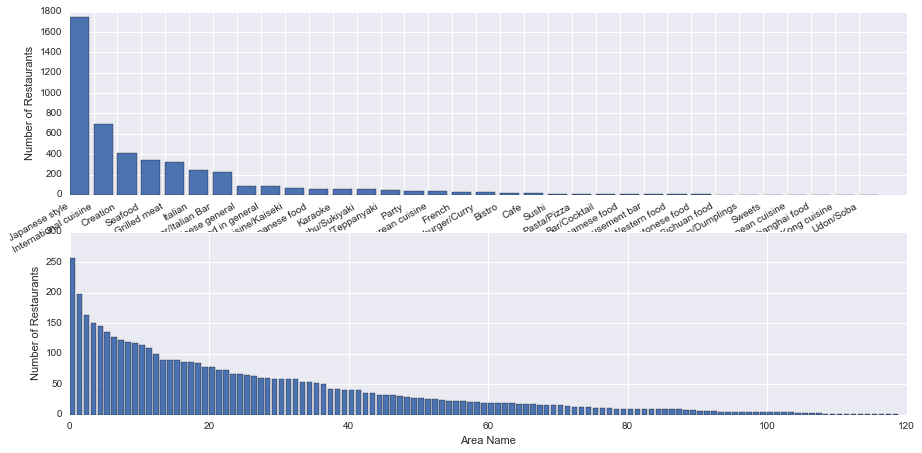

In [30]:
fig = plt.figure(figsize=(15, 8))
fig.add_subplot(2, 1, 1)

cuisines = [i for i in range(0, len(cuisine_type))]
plt.bar(cuisines, cuisine_type.hpg_store_id)
plt.xlabel('Cuisine Type')
plt.ylabel('Number of Restaurants')
plt.xticks(cuisines, cuisine_type.hpg_genre_name)
plt.gcf().autofmt_xdate(rotation=30)

fig.add_subplot(2, 1, 2)
area_ids = [i for i in range(0, len(area_name))]
print area_ids
plt.bar(area_ids, area_name.hpg_store_id)
plt.xlabel('Area Name')
plt.ylabel('Number of Restaurants')

Total number of restaurants for a given genre and area. The circle size is proportional to the number of restaurants. Again, we can see that hpg has a bigger database than air_reserve. All this information about the number of restaurants for a given genre and in a given area will used later when we apportionate the predicted number of visitors into different restaurants.

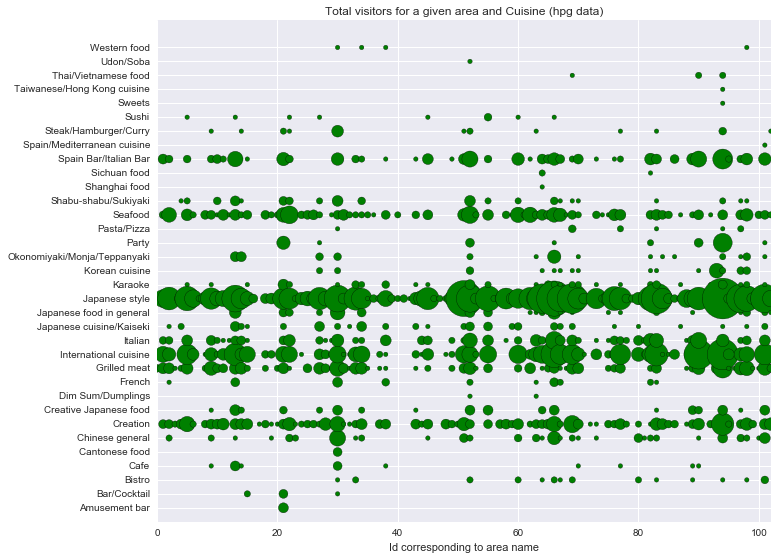

In [31]:
df = hpg_store.groupby(['hpg_area_name', 'hpg_genre_name'], as_index=False)['hpg_store_id'].count()

x = df.iloc[:,0]
uniques_x, X = np.unique(x, return_inverse=True)

y = df.iloc[:,1]
uniques_y, Y = np.unique(y, return_inverse=True)

plt.rc('font', **{'sans-serif' : 'Arial',
                           'family' : 'sans-serif'})

fig = plt.figure(figsize=(11, 9))
s = df.iloc[:,2].values*20

plt.scatter(X,Y,s=s, c='g')
plt.xlim(0, 102)
plt.xlabel('Id corresponding to area name')
plt.yticks(np.arange(min(Y), max(Y)+1, 1.0), uniques_y)
plt.ylim(-1, 35)
plt.title('Total visitors for a given area and Cuisine (hpg data)')
plt.show()

In [32]:
store_id_relation = pd.read_csv('store_id_relation.csv')
store_id_relation

,air_store_id,hpg_store_id
0,air_63b13c56b7201bd9,hpg_4bc649e72e2a239a
1,air_a24bf50c3e90d583,hpg_c34b496d0305a809
2,air_c7f78b4f3cba33ff,hpg_cd8ae0d9bbd58ff9
3,air_947eb2cae4f3e8f2,hpg_de24ea49dc25d6b8
4,air_965b2e0cf4119003,hpg_653238a84804d8e7
5,air_a38f25e3399d1b25,hpg_50378da9ffb9b6cd
6,air_3c938075889fc059,hpg_349b1b92f98b175e
7,air_68301bcb11e2f389,hpg_2c09f3abb2220659
8,air_5f6fa1b897fe80d5,hpg_40aff6385800ebb1
9,air_00a91d42b08b08d9,hpg_fbe603376b5980fc


#### Holiday Info

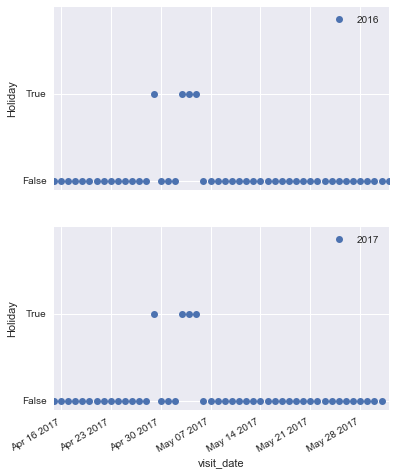

In [33]:
date_info['calendar_date'] = pd.to_datetime(date_info['calendar_date'])
date_info['day_of_week'] = date_info['day_of_week'].astype('category')

status = ['False', 'True']
a = [0, 1]
fig = plt.figure(figsize=(6, 8))
fig.add_subplot(2,1,1)
plt.plot(date_info.calendar_date, date_info.holiday_flg, 'o', label = '2016')
plt.xlabel('visit_date')
plt.ylabel('Holiday')
plt.xlim('2016-04-15', '2016-06-01')
plt.ylim(-.1, 2)
plt.yticks(a, status)
plt.legend()
plt.gcf().autofmt_xdate(rotation=30)

fig.add_subplot(2,1,2)
plt.plot(date_info.calendar_date, date_info.holiday_flg, 'o', label = '2017')
plt.xlabel('visit_date')
plt.ylabel('Holiday')
plt.xlim('2017-04-15', '2017-06-01')
plt.ylim(-.1, 2)
plt.yticks(a, status)
plt.legend()
plt.gcf().autofmt_xdate(rotation=30)

#### Total visitors as a function of date by genre and by area
We can see the jump in the total number of visitors by genre, that is because of the new stores being added in the database. When doing the time series analysis, we will use the total visitors by genre for old stores (ie, stores that were there from Jan 1 to Jun 30, 2016) and new stores (ie, stores that were added to the database from July 1 2016). Since these time series don't have discontinuity, prediction of seasonal and non-seasonal orders will be more accurate. 

Prediction from these different time series will then be used to predict the distribution of visitors among different cuisines. The distribution of visitors among different cuisines and areas is shown in the figure below. 

In [34]:
Totvstor_by_genre               =  fn.visitors_by_genre_area(air_visit, air_store)[0]
Totvstor_by_genre_orgnal_stores =  fn.visitors_by_genre_area(air_visit_orgnal_stores, air_store)[0]
Totvstor_by_genre_add_stores    =  fn.visitors_by_genre_area(air_visit_add_stores, air_store)[0]

Totvstor_by_area                =  fn.visitors_by_genre_area(air_visit, air_store)[1]
Totvstor_by_area_orgnal_stores  =  fn.visitors_by_genre_area(air_visit_orgnal_stores, air_store)[1]
Totvstor_by_area_add_stores     =  fn.visitors_by_genre_area(air_visit_add_stores, air_store)[1]

Totvstor_by_date_orgnal_stores  =  fn.visitors_by_genre_area(air_visit_orgnal_stores, air_store)[2]
Totvstor_by_date_add_stores     =  fn.visitors_by_genre_area(air_visit_add_stores, air_store)[2]

In [35]:
Totvstor_by_date_add_stores     =  fn.visitors_by_genre_area(air_visit_add_stores, air_store)[2]

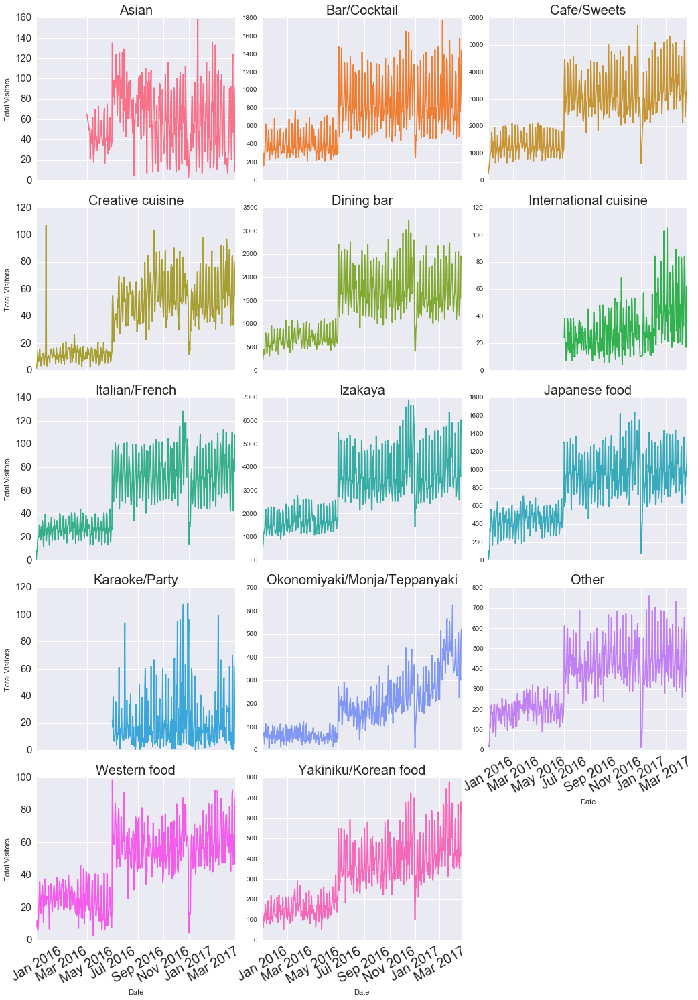

In [36]:
fn.vstors_by_genre_plot(Totvstor_by_genre)

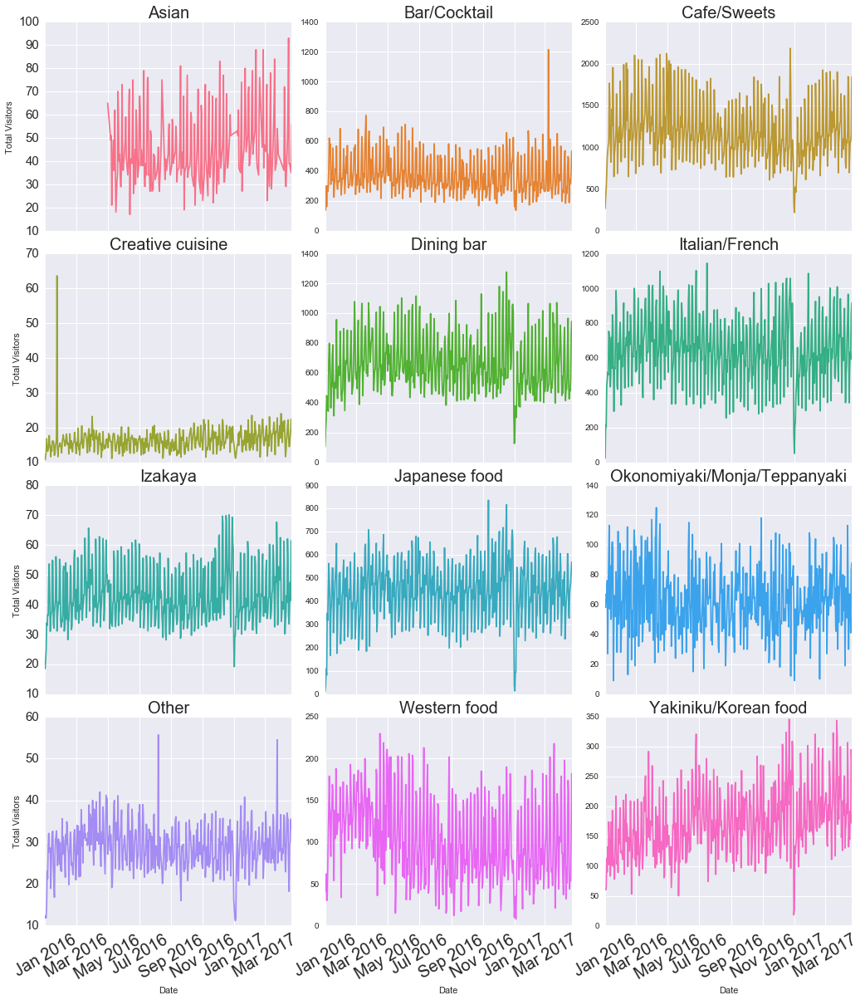

In [37]:
fn.vstors_by_genre_plot(Totvstor_by_genre_orgnal_stores)

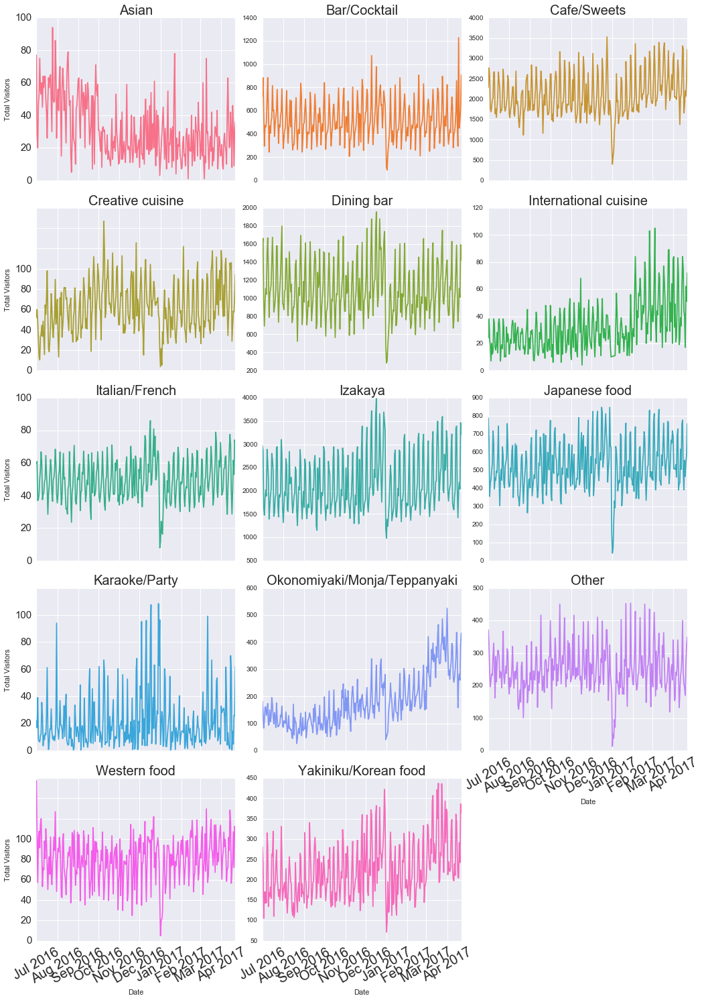

In [38]:
fn.vstors_by_genre_plot(Totvstor_by_genre_add_stores)

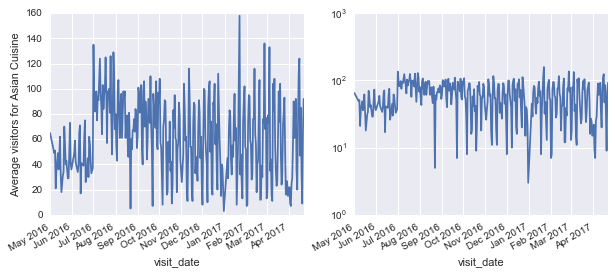

In [39]:
visitors_Asian = Totvstor_by_genre[Totvstor_by_genre['air_genre_name'] == 'Asian']
fig = plt.figure(figsize=(10, 4))
fig.add_subplot(1, 2, 1)
plt.plot(visitors_Asian.visit_date, visitors_Asian.visitors)
plt.xlabel('visit_date')
plt.ylabel('Average visitors for Asian Cuisine')
plt.gcf().autofmt_xdate(rotation=30)

fig.add_subplot(1,2,2)
plt.plot(visitors_Asian.visit_date, visitors_Asian.visitors)
plt.xlabel('visit_date')
plt.yscale('log')
plt.gcf().autofmt_xdate(rotation=30)

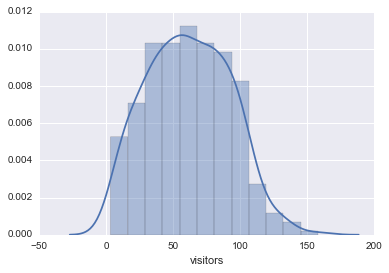

In [40]:
sns.distplot(visitors_Asian.visitors)

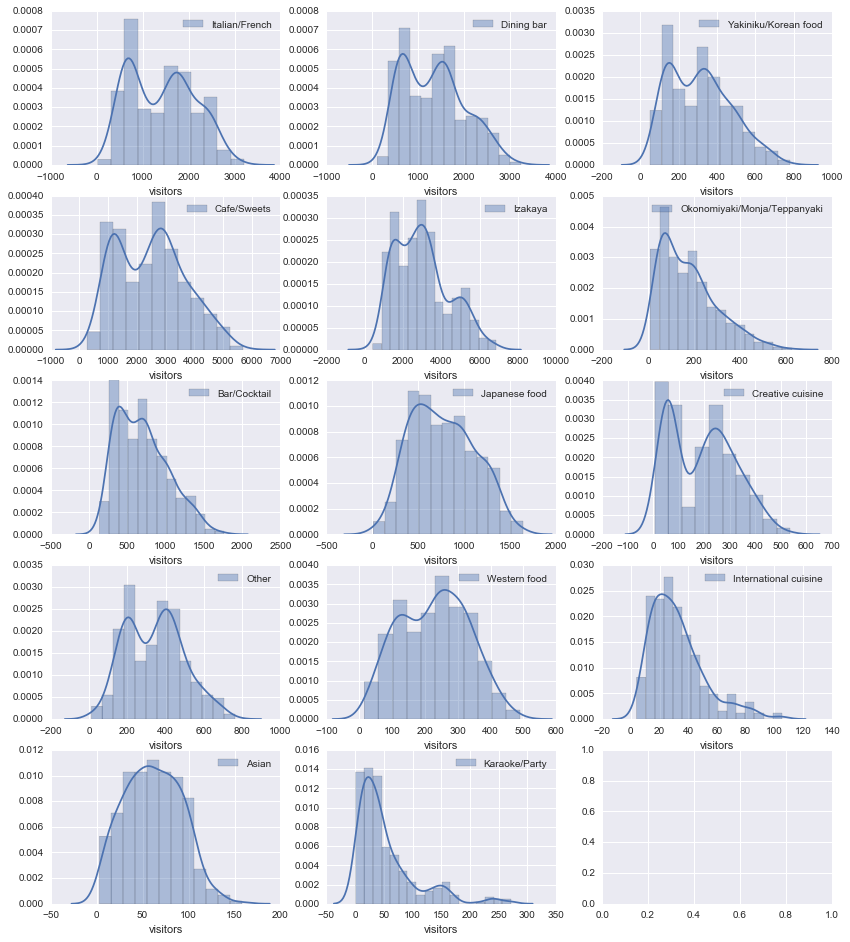

In [41]:
fig, axes = plt.subplots(5,3, figsize= (14,16))
axes = axes.flatten()

for ax, genre in zip(axes, genres):
    sns.distplot(Totvstor_by_genre[Totvstor_by_genre['air_genre_name'] == genre].visitors, \
                 ax=ax, label=genre)
    ax.legend()
plt.show()

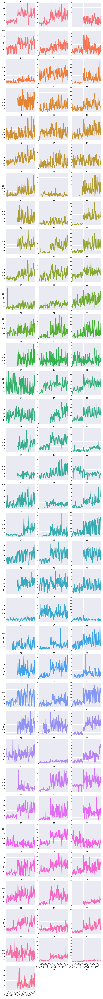

In [42]:
fn.vstors_by_area_plot(Totvstor_by_area)

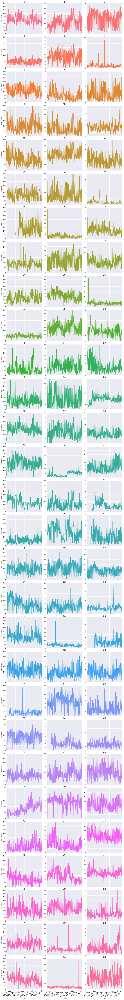

In [43]:
fn.vstors_by_area_plot(Totvstor_by_area_orgnal_stores)

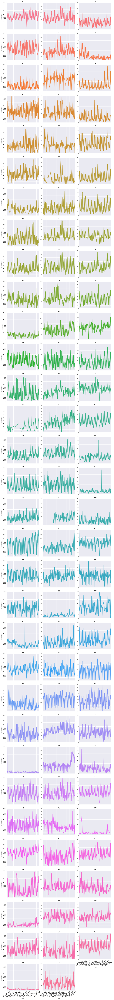

In [44]:
fn.vstors_by_area_plot(Totvstor_by_area_add_stores)

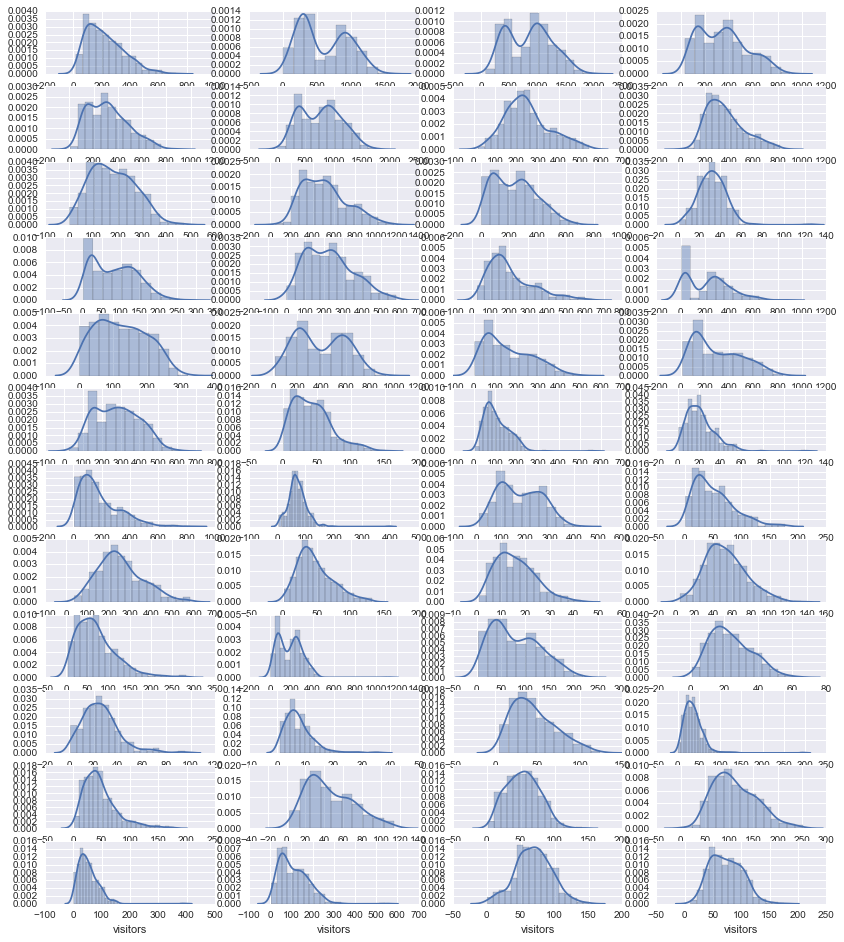

In [45]:
fig, axes = plt.subplots(12,4, figsize= (14,16))
axes = axes.flatten()

for ax, area in zip(axes, areas):
    sns.distplot(Totvstor_by_area[Totvstor_by_area['air_area_name'] == area].visitors, \
                 ax=ax)
    ax.legend()
plt.show()

#### Percentage distribution among different genres for a given area

In [46]:
area = 'Hyogo-ken Kobe-shi Kumoidori'
df = Totvstor_by_date_orgnal_stores.loc[Totvstor_by_date_orgnal_stores['air_area_name'] == area]
counter = df.groupby('visit_date')['air_genre_name'].value_counts().unstack()
percentage_dist = 100 * counter.divide(counter.sum(axis = 1), axis = 0)

In [47]:
Totvstor_by_date_orgnal_stores[(Totvstor_by_date_orgnal_stores['air_area_name'] == 'Hyogo-ken Kobe-shi Kumoidori') \
& (Totvstor_by_date_orgnal_stores['air_genre_name'] == 'Cafe/Sweets')]

,air_area_name,air_genre_name,visit_date,visitors
18341,Hyogo-ken Kobe-shi Kumoidori,Cafe/Sweets,2016-01-02,30
18342,Hyogo-ken Kobe-shi Kumoidori,Cafe/Sweets,2016-01-03,35
18343,Hyogo-ken Kobe-shi Kumoidori,Cafe/Sweets,2016-01-04,29
18344,Hyogo-ken Kobe-shi Kumoidori,Cafe/Sweets,2016-01-05,5
18345,Hyogo-ken Kobe-shi Kumoidori,Cafe/Sweets,2016-01-07,8
18346,Hyogo-ken Kobe-shi Kumoidori,Cafe/Sweets,2016-01-08,15
18347,Hyogo-ken Kobe-shi Kumoidori,Cafe/Sweets,2016-01-09,29
18348,Hyogo-ken Kobe-shi Kumoidori,Cafe/Sweets,2016-01-10,39
18349,Hyogo-ken Kobe-shi Kumoidori,Cafe/Sweets,2016-01-11,41
18350,Hyogo-ken Kobe-shi Kumoidori,Cafe/Sweets,2016-01-12,13


In [48]:
percentage_dist.ix['2016-01-01':'2016-06-30']

/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  if __name__ == '__main__':


air_genre_name,Cafe/Sweets,Dining bar,Italian/French,Izakaya,Okonomiyaki/Monja/Teppanyaki,Yakiniku/Korean food
visit_date,,,,,,
2016-01-01,NaN,50.000000,50.000000,NaN,NaN,NaN
2016-01-02,33.333333,33.333333,33.333333,NaN,NaN,NaN
2016-01-03,33.333333,33.333333,33.333333,NaN,NaN,NaN
2016-01-04,20.000000,20.000000,20.000000,NaN,20.000000,20.000000
2016-01-05,20.000000,20.000000,NaN,20.000000,20.000000,20.000000
2016-01-06,NaN,33.333333,NaN,33.333333,NaN,33.333333
2016-01-07,16.666667,16.666667,16.666667,16.666667,16.666667,16.666667
2016-01-08,16.666667,16.666667,16.666667,16.666667,16.666667,16.666667
2016-01-09,16.666667,16.666667,16.666667,16.666667,16.666667,16.666667


In [49]:
# percentage_dist.ix['2016-03-01':'2016-03-28'].plot.bar(stacked=True, figsize=(17,12), width=1)
# plt.legend(loc='center left', bbox_to_anchor=(0.5, 1.1))
# plt.ylim(0,100)
# plt.show()

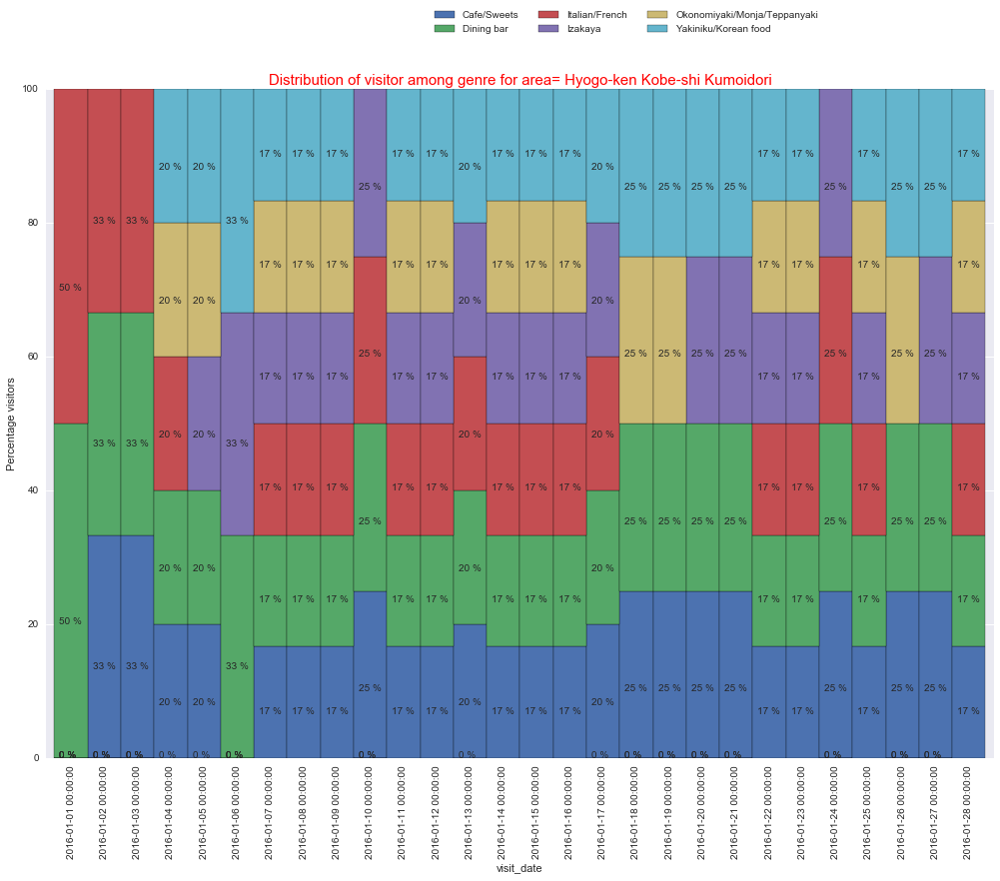

In [50]:
ax = percentage_dist.ix['2016-01-01':'2016-01-28'].plot.bar(stacked=True, figsize=(17,12), width=1)
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate('{:.0f} %'.format(height), (p.get_x()+.15*width, p.get_y()+.4*height))
plt.legend(loc='center left', ncol=3, shadow=True, bbox_to_anchor=(0.4, 1.1), fancybox=True)
plt.title('Distribution of visitor among genre for area= Hyogo-ken Kobe-shi Kumoidori', \
          fontsize=15, color = 'red')
plt.ylabel('Percentage visitors')
plt.ylim(0,100)
plt.savefig("Percent_dist.pdf", dpi=150)
plt.show()

In [51]:
air_store['air_area_name'] = air_store['air_area_name'].str.replace('ō','o').str.replace('Ō','O')
# air_store['area'] = air_store['area'].str.replace(u'ō','o').str.replace(u'Ō','O')

### The holiday impact
Now we will look at the impact of holidays on the number of visitors.

['calendar_date', 'day_of_week', 'holiday_flg']


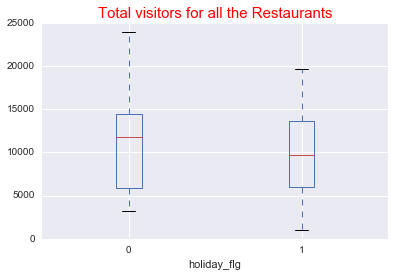

['calendar_date', 'visitors']
['calendar_date', 'visitors']


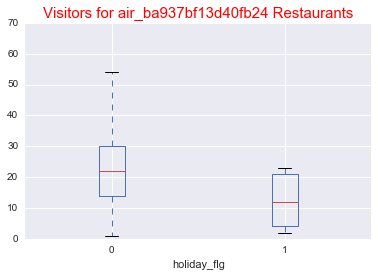

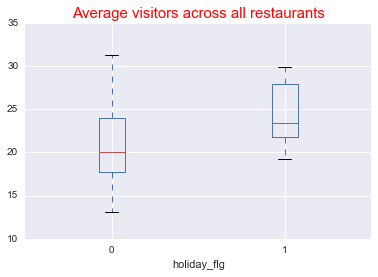

In [52]:
print list(date_info)


date_info
a1 = air_visit.groupby('visit_date', as_index=False)['visitors'].sum()
a1.rename(columns={'visit_date': 'calendar_date'}, inplace=True)
allvisitors_holiday = date_info.merge(a1, on='calendar_date', how='left')
allvisitors_holiday.dropna(inplace=True)
allslice = allvisitors_holiday.iloc[:, [2,3]]
allslice.boxplot(column='visitors', by='holiday_flg')
plt.title('Total visitors for all the Restaurants', fontsize=15, color='red')
plt.suptitle("")
plt.show()

b1 = air_visit[air_visit.air_store_id=='air_ba937bf13d40fb24'].iloc[:,[1,2]]
b1.rename(columns={'visit_date': 'calendar_date'}, inplace=True)
print list(a1)
print list(b1)
date_info
visitors_holiday = date_info.merge(b1, on='calendar_date', how='left')
visitors_holiday
store_slice = visitors_holiday.iloc[:, [2,3]]
store_slice.boxplot(column='visitors', by='holiday_flg')
plt.title('Visitors for air_ba937bf13d40fb24 Restaurants', fontsize=15, color='red')
plt.suptitle("")
plt.show()

c1 = air_visit.groupby('visit_date', as_index=False)['visitors'].mean()
c1.rename(columns={'visit_date': 'calendar_date'}, inplace=True)
allvisitors_holiday = date_info.merge(c1, on='calendar_date', how='left')
allvisitors_holiday.dropna(inplace=True)
allslice = allvisitors_holiday.iloc[:, [2,3]]

allslice.boxplot(column='visitors', by='holiday_flg')
plt.title('Average visitors across all restaurants', fontsize=15, color='red')
plt.suptitle("")
plt.show()

/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


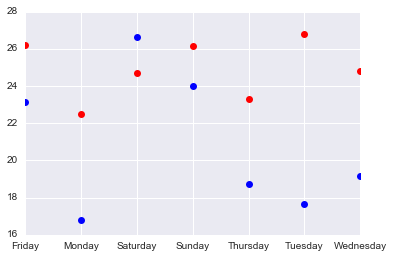

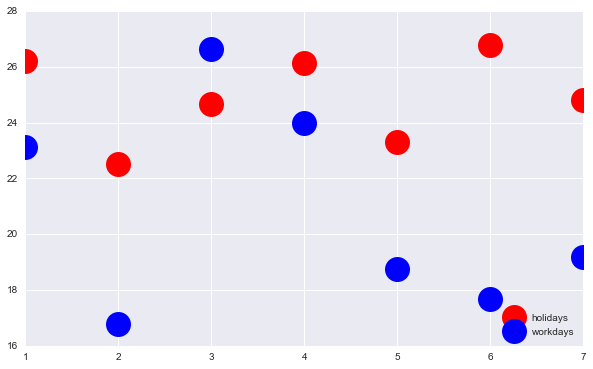

In [53]:
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
weekdays = [i for i in range(1,8)]
data = allvisitors_holiday[allvisitors_holiday.holiday_flg == 1]
data['day_of_week'] = data['day_of_week'].astype("category")
avgvstor_hol = data.groupby('day_of_week', as_index=False)['visitors'].mean()

data = allvisitors_holiday[allvisitors_holiday.holiday_flg == 0]
data['day_of_week'] = data['day_of_week'].astype("category")
                                                
avgvstor_nonhol = data.groupby('day_of_week', as_index=False)['visitors'].mean()

plt.plot(weekdays, avgvstor_hol.visitors, 'ro', \
         weekdays, avgvstor_nonhol.visitors, 'bo')
plt.xticks(weekdays, avgvstor_nonhol.day_of_week)
plt.show()
avgvstor_nonhol

fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(weekdays, avgvstor_hol.visitors, 'ro', markersize=25, label = 'holidays')
ax.plot(weekdays, avgvstor_nonhol.visitors, 'bo', markersize=25, label = 'workdays')
legend = ax.legend(loc = 'lower right')


#### HPG_reserve data

In [56]:
# hpg_reserve.visit_datetime.datetime.now().date()
# datetime.datetime.now().date()
# df['just_date'] = df['dates'].dt.date
hpg_reserve['visit_date'] = hpg_reserve.visit_datetime.dt.date
list(hpg_reserve)

['hpg_store_id',
 'visit_datetime',
 'reserve_datetime',
 'reserve_visitors',
 'reservation_inadvance',
 'reservation_time',
 'visit_date']

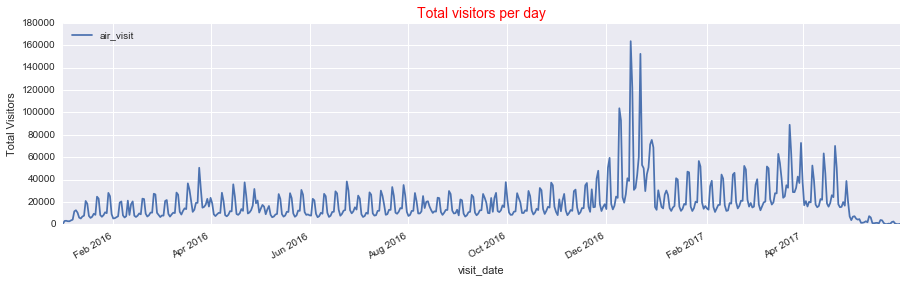

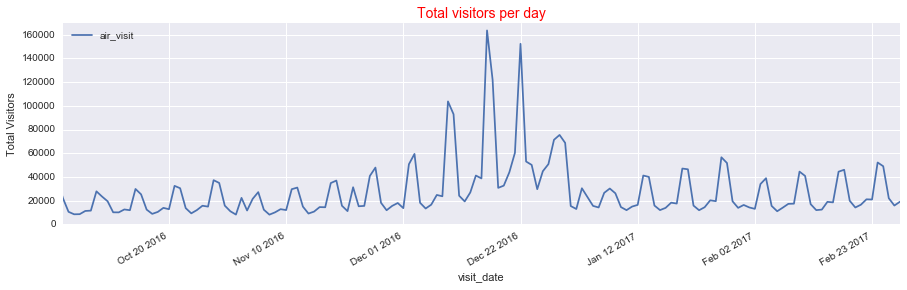

In [57]:
HPG_Totalvisitors_day = hpg_reserve.groupby('visit_date', as_index=False)\
                    ['reserve_visitors'].sum()

HPG_Totalvisitors_day.rename(columns={'reserve_visitors':'visitors'}, \
                                              inplace=True)

fn.totvstors_date(HPG_Totalvisitors_day, None, None)
fn.totvstors_date(HPG_Totalvisitors_day, ('2016-10-01', '2017-02-28'), (0, 170000))

In [58]:
hpg_reserve.set_index('visit_date', drop=False, inplace=True)
hpg_reserve['visit_datetime'].dt.date
hpg_reserve.index = pd.to_datetime(hpg_reserve.index)

In [59]:
print len(hpg_reserve.ix[:'2016-10-31'].hpg_store_id.unique())
print len(hpg_reserve.ix['2016-09-01':].hpg_store_id.unique())
print len(hpg_reserve.ix['2017-01-31':].hpg_store_id.unique())

/Users/pushparaghani/anaconda64/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  if __name__ == '__main__':


12421
13275
13087
